# Problem Statement
With increasing number of mass shooting incidents at schools, malls and other public places across US of A, there is a need of effective monitoring systems that can identify potential dangers and alert beforehand. Law enforcement agencies that guard public places currently rely on technology like walk-through or handheld magnetometers, which detect changes in local magnetic fields.

The requirement is to create an AI powered gun detection system that can identify threats by connecting with the existing video surveillance cameras to reliably and rapidly recognize firearms and immediately trigger multi-channel alerts and automate pre-defined safety protocols.

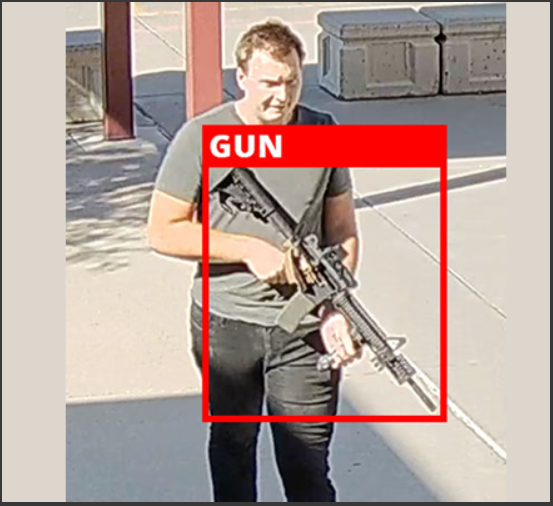

In [1]:
import os
import random
import glob
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf

In [2]:
# notebook configuration
pd.set_option("display.max_columns", None)
sns.set_theme(style = "whitegrid")
warnings.filterwarnings("ignore")
# plt.rcParams['figure.figsize'] = (20, 10)

# Introduction To Object Detection
In Image classification, CNNs were developed to detect objects present anywhere in an image and assign them with a probability scores and labels. The class labels and probability scores are generally associated with the full image and care about the presence or absence of the object of interest in the image. 

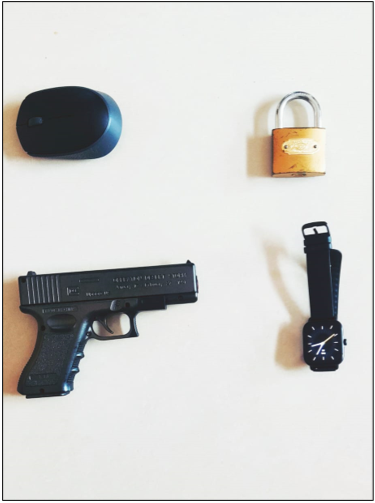

But what if there is need to find the location of the object of interest in the image or how many objects are present in the image?

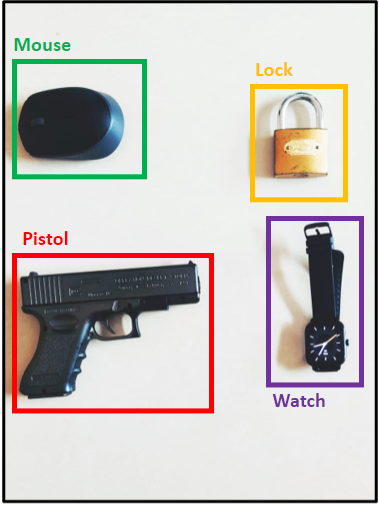

Object detection addresses these limitations by not only identifying the presence of objects but also pinpointing their exact locations within an image. This is typically achieved by drawing bounding boxes around the detected objects.

### Key differences from Image Classification
- Granularity: Image classification provides a label for the entire image, while object detection focuses on individual objects within the image.
- Output:
    - Image classification: Class label and probability score.
    - Object detection: Class label, probability score and bounding box coordinates.
- Spatial information: Object detection explicitly considers the spatial relationships between objects in the image.

### Applications of Object Detection
- Self-driving cars: Detecting pedestrians, vehicles and traffic signs.
- Surveillance systems: Identifying and tracking individuals or objects of interest.
- Medical image analysis: Detecting tumors or anomalies in medical images.
- Retail: Analyzing customer behavior and inventory management.
- Robotics: Enabling robots to interact with the environment.

In summary, object detection is a crucial task in Computer Vision that provides more detailed information about the content of an image compared to image classification. By combining object localization and classification, it enables a wide range of applications that require understanding the spatial arrangement of object in a scene.

# Loading And Exploring The Dataset

In [3]:
datapath = "pistol_data/"
!ls {datapath}

pistol_annotations pistol_images


In [4]:
annot_files = sorted(os.listdir(f"{datapath}pistol_annotations"))
img_files = sorted(os.listdir(f"{datapath}pistol_images"))

print(f'Total files: {len(annot_files)}')
print(f'Top 5: {annot_files[:5]}')
print(f'Top 5: {img_files[:5]}')

Total files: 3703
Top 5: ['1.txt', '10.txt', '100.txt', '1000.txt', '1001.txt']
Top 5: ['1.jpg', '10.jpg', '100.jpg', '1000.jpg', '1001.jpg']


In [5]:
# content in each of the annotation files
for annot_file in annot_files[0: 5]:
    with open(f"{datapath}pistol_annotations/{annot_file}", "r") as file:
        print(file.readlines())

['1 0.4253846153846154 0.2447973713033954 0.22153846153846152 0.2814895947426068']
['1 0.4983922829581993 0.4907407407407407 0.3665594855305466 0.4506172839506173']
['1 0.6466602129719264 0.28387096774193543 0.08131655372700872 0.05935483870967742']
['1 0.5747967479674796 0.39390243902439026 0.27804878048780485 0.3341463414634146']
['1 0.5061538461538462 0.4229559748427673 0.3353846153846154 0.3050314465408805']


Each `.txt` file inside pistol_annotations contains 4 point coordinated which represent the location of the Gun in the corresponding image as (`x_center`, `y_center`, `width`, `height`).

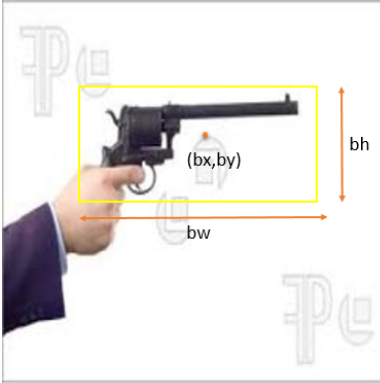

[1.0, 0.4253846153846154, 0.2447973713033954, 0.22153846153846152, 0.2814895947426068]
Image Resolution (416, 416, 3)
[1.0, 0.5188888888888888, 0.6283333333333333, 0.22, 0.27]
Image Resolution (416, 416, 3)
[1.0, 0.5672727272727273, 0.27322404371584696, 0.4290909090909091, 0.5027322404371584]
Image Resolution (416, 416, 3)
[1.0, 0.6140684410646388, 0.23177083333333331, 0.49809885931558934, 0.2864583333333333]
Image Resolution (416, 416, 3)
[1.0, 0.6994535519125683, 0.37999999999999995, 0.07650273224043716, 0.23636363636363636]
Image Resolution (416, 416, 3)


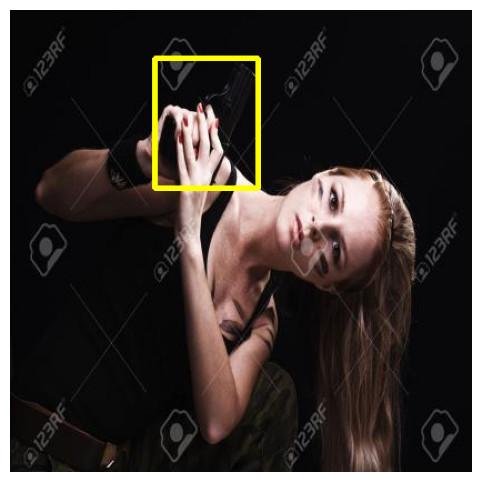

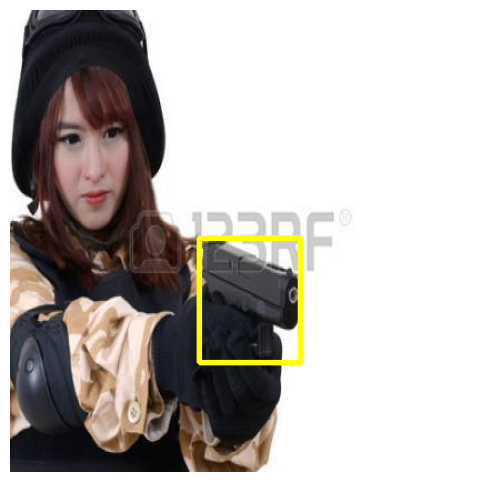

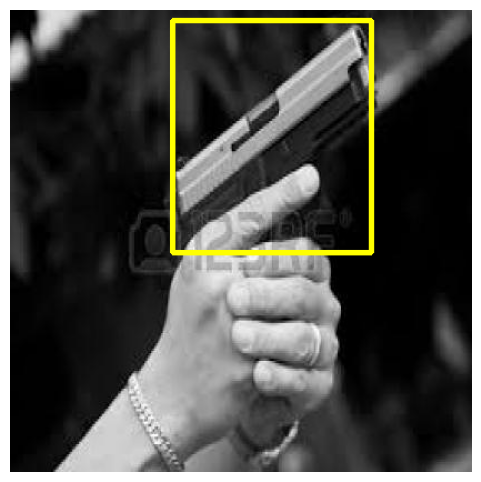

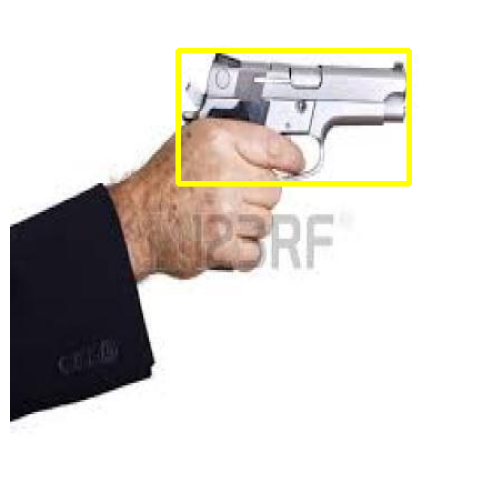

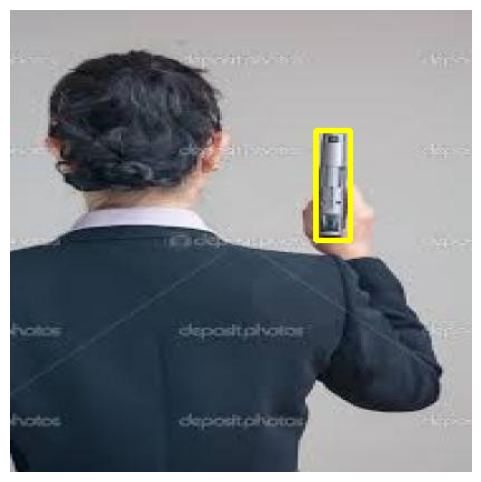

In [6]:
import cv2

img_h = 416
img_w = 416

def cv_coords(box):
    """
    This function will convert B.B cordinates from (X_center,Y_center,width,height) format
    to (x_start,y_start,x_end,y_end) required for cv2 to annotate rectangle on objects
    """
    x, y, w, h= box[1], box[2], box[3], box[4]
    x1, y1 = int((x - w/2) * img_w), int((y - h/2) * img_h)
    x2, y2 = int((x + w/2) * img_w), int((y + h/2) * img_h)
    return x1, y1, x2, y2

def plot_img_and_box(img, bbox):
    plt.figure(figsize = (6, 6))
    print("Image Resolution",img.shape)
    bbox = cv_coords(bbox)
    start_point = (bbox[0], bbox[1])
    end_point = (bbox[2], bbox[3])
    # convert to writable format (or make a copy)
    img = img.copy() 
    img = cv2.rectangle(img, start_point, end_point, (255, 255, 0), 3)
    plt.axis("off")
    plt.imshow(img)

for i in range(5):
    img_path = f"{datapath}pistol_images/{i+1}.jpg"
    label_path = f"{datapath}pistol_annotations/{i+1}.txt"

    img = plt.imread(img_path)

    with open(label_path, "r") as file:
        bbox = (file.readlines())
        bbox = [float(element) for element in bbox[0].split(" ")]
        print(bbox)

    plot_img_and_box(img, bbox)

# Classification + Localization
The CNN architecture can be modified for classification and localization, the final layers will have to be adapted to output both the class probability and the bounding box coordinates. The following is a common approach,
1. Feature extraction backbone: Retain the existing convolutional layers of the chosen CNN architecture (e.g., VGG, ResNet, EfficientNet) to extract features from the input image.
2. Dual-head output layer:
    - Classification head:
        - Add a fully connected (FC) layer with the number of units equal to the number of classes.
        - Apply a softmax activation function to obtain class probabilities.
    - Localization head:
        - Add another FC layer with four output units.
        - Each unit represents:
            - x-coordinate of the bounding box center.
            - y-coordinate of the bounding box center.
            - width of the bounding box.
            - height of the bounding box.
3. Loss function:
    - Classification loss: Use cateforical cross-entropy loss to measure the discrepancy between predicted and true class probabilities.
    - Localization loss: Use L1 or L2 loss (Mean Absolute Error or Mean Squared Error) to measure the difference between predicted and ground-truth bounding box coordinates.
    - Combined loss: Combine the classification and localization losses with appropriate weights.

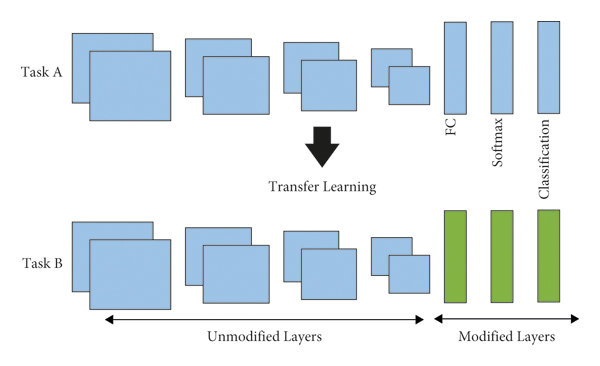

### Key points
- The feature extraction backbone provides a rich representation of the image.
- The dual-head output layer allows the network to simultaneously predict both the class and the bounding box.
- The choice of loss function is crucial for training the model effectively.

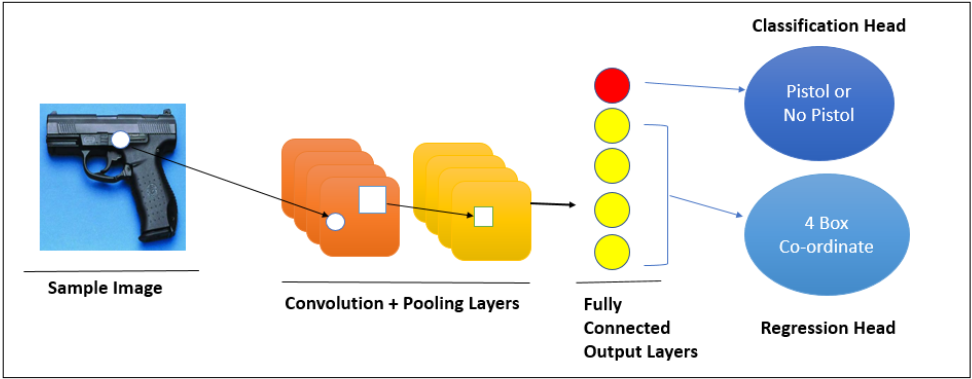

In [7]:
# loading the dataset into arrays
from tqdm.auto import tqdm

def return_bbox(label_path):
    """
    read and return bbox from text file
    """
    with open(label_path, "r") as file:
        bbox = (file.readlines())
        bbox = [float(element) for element in bbox[0].split(" ")]
        return bbox[0], bbox[1: ]

def return_image_label(filename):
    """
    read and return image as well as corresponding label and bbox from image file
    """
    try:
        img_path = f"{datapath}pistol_images/{filename}.jpg"
        image = plt.imread(img_path)
        label_path = f"{datapath}pistol_annotations/{filename}.txt"
        class_label, bbox_label = return_bbox(label_path)
        return True, image, class_label, bbox_label
    except Exception as e:
        print("Exception: ", filename, str(e))
        return False, None, None, None


### Looping over all the files present in directory to extract image, labels and bbox
images, class_labels, bbox_labels = [], [], []
for filename in tqdm(annot_files):
    filename = filename[: -4]
    status, image, class_label, bbox_label= return_image_label(filename)
    if status == True and image.shape == (416,416,3):
        images.append(image)
        class_labels.append(class_label)
        bbox_labels.append(bbox_label)


images, class_labels, bbox_labels = np.array(images),np.array(class_labels),np.array(bbox_labels)
images.shape, class_labels.shape, bbox_labels.shape

100%|██████████| 3703/3703 [00:06<00:00, 546.51it/s]


((3703, 416, 416, 3), (3703,), (3703, 4))

In [8]:
class_label

1.0

In [9]:
bbox_labels

array([[0.42538462, 0.24479737, 0.22153846, 0.28148959],
       [0.49839228, 0.49074074, 0.36655949, 0.45061728],
       [0.64666021, 0.28387097, 0.08131655, 0.05935484],
       ...,
       [0.66423077, 0.51078799, 0.45153846, 0.815197  ],
       [0.49666667, 0.49450549, 0.92666667, 0.79120879],
       [0.48653846, 0.45345188, 0.97153846, 0.90481172]])

In [10]:
# frequency distribution of gun and no-gun class
np.unique(class_labels, return_counts = True)

(array([0., 1.]), array([ 999, 2704]))

There are 999 images with no guns and 2704 images with guns present in the frame.

In [11]:
# splitting the dataset into train and test set
from sklearn.model_selection import train_test_split

x_train, x_test, y_train_class, y_test_class, y_train_box, y_test_box = train_test_split(images, class_labels, bbox_labels, test_size = 0.30, random_state = 42)
x_train.shape, x_test.shape, y_train_class.shape, y_test_class.shape, y_train_box.shape, y_test_box.shape

((2592, 416, 416, 3),
 (1111, 416, 416, 3),
 (2592,),
 (1111,),
 (2592, 4),
 (1111, 4))

In [12]:
y_train_class

array([1., 0., 1., ..., 1., 1., 1.])

In [13]:
y_train_box

array([[0.41620112, 0.56560284, 0.24022346, 0.10992908],
       [0.        , 0.        , 0.        , 0.        ],
       [0.48333333, 0.50518519, 0.75555556, 0.89481481],
       ...,
       [0.496875  , 0.5       , 0.98125   , 0.95      ],
       [0.5       , 0.47757848, 0.996875  , 0.95067265],
       [0.517     , 0.51201201, 0.694     , 0.96996997]])

In [14]:
import ssl

ssl._create_default_https_context = ssl._create_unverified_context

In [15]:
# creating the architecture to generate bbox coordinates along with class probability
ResNet101 = tf.keras.applications.ResNet101(weights = "imagenet", include_top = False, input_tensor = tf.keras.layers.Input(shape = (416, 416, 3)))

# setting trainable parameter to False
ResNet101.trainable = False

# adding some trainable dense layers
res_output = ResNet101.output
flat = tf.keras.layers.Flatten()(res_output)

# classification head
x1 = tf.keras.layers.Dense(128, activation = "relu")(flat)
x1 = tf.keras.layers.Dense(64, activation = "relu")(x1)
x1 = tf.keras.layers.Dense(32, activation = "relu")(x1)

# classification output: single class
class_out = tf.keras.layers.Dense(1, activation = "sigmoid", name = "class_output")(x1)

# regression head
x1 = tf.keras.layers.Dense(128, activation = "relu")(flat)
x1 = tf.keras.layers.Dense(64, activation = "relu")(x1)
x1 = tf.keras.layers.Dense(32, activation = "relu")(x1)

# regression output: 4 bbox coordinates
reg_out = tf.keras.layers.Dense(4, activation = "sigmoid", name = "box_output")(x1)

ResNet101_final = tf.keras.models.Model(ResNet101.input, [reg_out, class_out])

2025-02-12 10:15:22.295220: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1
2025-02-12 10:15:22.295425: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 8.00 GB
2025-02-12 10:15:22.295429: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 2.67 GB
I0000 00:00:1739335522.296166 8023333 pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
I0000 00:00:1739335522.296464 8023333 pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [16]:
ResNet101_final.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 416, 416,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 422, 422,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 208, 208,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 208, 208,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 208, 208,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 210, 210,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 104, 104,  │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 104, 104,  │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 104, 104,  │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 104, 104,  │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 104, 104,  │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 104, 104,  │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 104, 104,  │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 104, 104,  │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 104, 104,  │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 104, 104,  │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 104, 104,  │      1,024 │ conv2_block1_3_c

 Total params: 131,283,941 (500.81 MB)

 Trainable params: 88,625,765 (338.08 MB)

 Non-trainable params: 42,658,176 (162.73 MB)

# Model Configuration And Loss Function Mappings

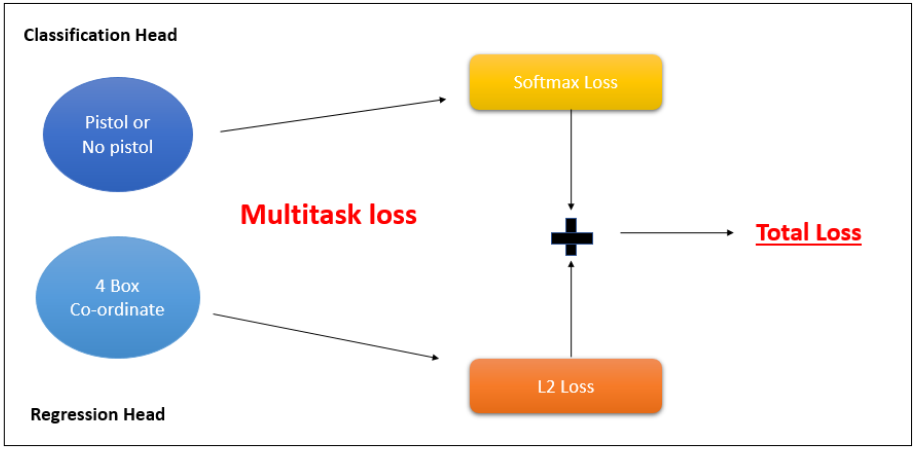

In [17]:
# loss for classification + regression
losses = {
    "class_output": "binary_crossentropy",
    "box_output": "mean_squared_error"
}

# loss weight: optional
loss_weights = {
    "box_output": 4.0,
    "class_output": 1.0
}

# metrics for both head to track
metrics = {
    "box_output": "mse",
    "class_output": "accuracy"
}

# optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-4)

In [18]:
# compiling the model
ResNet101_final.compile(optimizer = optimizer, loss = losses, loss_weights = loss_weights, metrics = metrics)

In [19]:
# confirming if GPU support is enabled
devices = tf.config.list_physical_devices()
print("\nDevices: ", devices)


Devices:  [PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [20]:
gpus = tf.config.list_physical_devices("GPU")
if gpus:
    details = tf.config.experimental.get_device_details(gpus[0])
    print("GPU details: ", details)

GPU details:  {'device_name': 'METAL'}


In [21]:
# # setup for tensorboard visualization
# log_dir = "pistol_log"
# !rm -rf log_dir
# tensorboard_callback = tf.keras.callbacks.Tensorboards(log_dir = log_dir)

# training the model
history = ResNet101_final.fit(
    x = x_train, 
    y = {"class_output": y_train_class, "box_output": y_train_box},
    validation_data = (x_test, {"class_output": y_test_class, "box_output": y_test_box}),
    batch_size = 32,
    epochs = 10
    # callbacks = (tensorboard_callback)
)

Epoch 1/10


2025-02-12 10:15:40.902600: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


81/81 ━━━━━━━━━━━━━━━━━━━━ 329s 4s/step - box_output_loss: 0.2442 - box_output_mse: 0.2442 - class_output_accuracy: 0.9489 - class_output_loss: 0.2663 - loss: 1.2433 - val_box_output_loss: 0.2005 - val_box_output_mse: 0.2002 - val_class_output_accuracy: 0.9964 - val_class_output_loss: 0.0894 - val_loss: 0.8908
Epoch 2/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 393s 5s/step - box_output_loss: 0.1933 - box_output_mse: 0.1933 - class_output_accuracy: 0.9978 - class_output_loss: 0.0153 - loss: 0.7887 - val_box_output_loss: 0.2009 - val_box_output_mse: 0.2007 - val_class_output_accuracy: 0.9955 - val_class_output_loss: 0.0474 - val_loss: 0.8507
Epoch 3/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 452s 6s/step - box_output_loss: 0.1939 - box_output_mse: 0.1939 - class_output_accuracy: 0.9950 - class_output_loss: 0.0783 - loss: 0.8538 - val_box_output_loss: 0.1956 - val_box_output_mse: 0.1954 - val_class_output_accuracy: 0.9964 - val_class_output_loss: 0.0683 - val_loss: 0.8503
Epoch 4/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 501s

Both class loss and bbox loss are decreasing continuously as expected.

In [22]:
# visualizing the training on tensorboard
# pip install tensorboard
# %load_ext tensorboard
# %tensorboard --logdir={log_dir}

The localization model is ready and can be used for inference and evaluation.

# Prediction And Evaluation

### Prediction on images in the test set

In [23]:
def predict(input_img_arr, model, mode = "single"):
    if mode is "single":
        input_img_arr = np.expand_dims(input_img_arr, axis = 0)
        pred_box, class_prob = model.predict(input_img_arr)
        return pred_box[0], class_prob[0]
    else:
        pred_box, class_prob = model.predict(input_img_arr)
        return pred_box, class_prob

predict(x_test[0], ResNet101_final)

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


(array([2.4038649e-10, 3.6000548e-29, 0.0000000e+00, 0.0000000e+00],
       dtype=float32),
 array([1.], dtype=float32))

In [24]:
predict(x_test[0: 4], ResNet101_final, "batch")

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


(array([[2.4038649e-10, 3.6002474e-29, 0.0000000e+00, 0.0000000e+00],
        [0.0000000e+00, 1.5098582e-34, 0.0000000e+00, 0.0000000e+00],
        [0.0000000e+00, 2.8174379e-37, 0.0000000e+00, 0.0000000e+00],
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00]],
       dtype=float32),
 array([[1.],
        [1.],
        [0.],
        [0.]], dtype=float32))

### Evaluation (MSE and BCE on test)

In [25]:
eval_res = ResNet101_final.evaluate(x_test, {"class_output": y_test_class, "box_output": y_test_box})

35/35 ━━━━━━━━━━━━━━━━━━━━ 122s 3s/step - box_output_loss: 0.1947 - box_output_mse: 0.1947 - class_output_accuracy: 0.9934 - class_output_loss: 0.2069 - loss: 0.9856


In [26]:
print(f"Total Loss: {eval_res[0]}\nBBox MSE Loss{eval_res[1]}\nClass BCE Loss: {eval_res[2]}\nBBox MSE: {eval_res[3]}\nAccuracy Score: {eval_res[4]}\n")

Total Loss: 0.8750180006027222
BBox MSE Loss0.20345330238342285
Class BCE Loss: 0.06147625669836998
BBox MSE: 0.20326094329357147
Accuracy Score: 0.9963996410369873



Plotting the predicted bounding boxes (bbox) against the ground truth boxes.

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 617ms/step
Ground Truth:  [0.50625    0.45416667 0.9125     0.89166667]
Prediction:  [8.5507802e-23 1.8512927e-35 0.0000000e+00 1.0000000e+00]
ImgResolution (416, 416, 3)


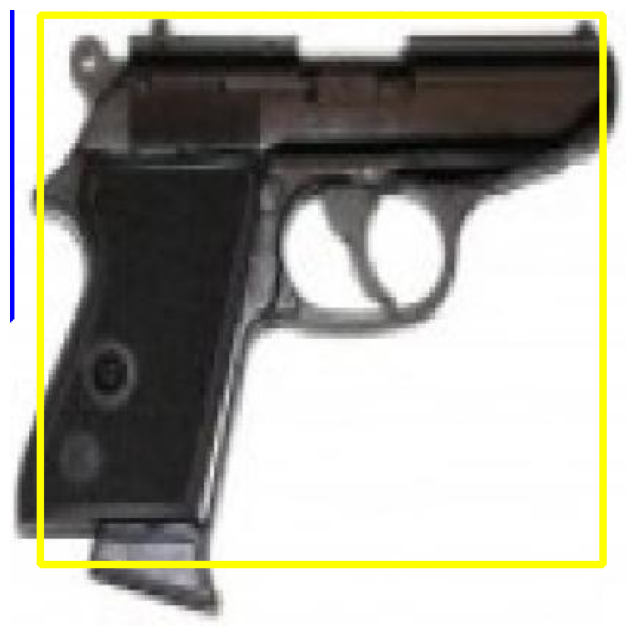

In [27]:
def cv_coords(box):
    """
    This function will convert B.B cordinates from (X_center,Y_center,width,height)  format
    to (x_start,y_start,x_end,y_end) required for cv2 to create rectangle
    """
    x, y, w, h= box[0], box[1], box[2], box[3]
    x1, y1 = int((x - w/2) * img_w), int((y - h/2) * img_h)
    x2, y2 = int((x + w/2) * img_w), int((y + h/2) * img_h)
    return x1, y1, x2, y2

def plot_prediction(img, label, pred):
    img = img.copy()
    plt.figure(figsize = (8, 8))
    print("ImgResolution", img.shape)
    # annotate ground truth
    bbox = cv_coords(label)
    start_point = (bbox[0], bbox[1])
    end_point = (bbox[2], bbox[3])
    img = cv2.rectangle(img, start_point, end_point, (255,255,0), 3)
    cv2.putText(img, "Ground Truth", (start_point[0], start_point[1] - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0))
    # annotate prediction
    bbox = cv_coords(pred)
    start_point = (bbox[0], bbox[1])
    end_point = (bbox[2], bbox[3])
    img = cv2.rectangle(img, start_point, end_point, (0, 0, 255), 3)
    cv2.putText(img, "Prediction", (start_point[0], start_point[1]-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0))
    plt.axis("off")
    plt.imshow(img)

# set index which will be used for prediction and plot
index = 500

label = y_test_box[index]

img = x_test[index]
pred_box, class_prob = predict(img, ResNet101_final)

print("Ground Truth: ", label)
print("Prediction: ", pred_box)

plot_prediction(img, label, pred_box)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
Ground Truth:  [0.5125     0.49166667 0.95       0.96666667]
Predicted Bbox:  [1.0766959e-25 9.3505657e-35 0.0000000e+00 1.0000000e+00]
ImgResolution (416, 416, 3)


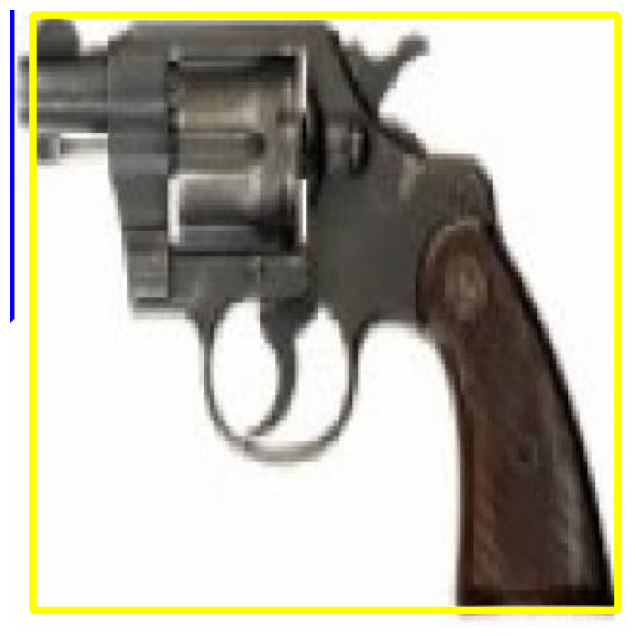

In [28]:
index = 101

label = y_test_box[index]

img = x_test[index]
pred_box, class_prob = predict(img, ResNet101_final)

print("Ground Truth: ", label)
print("Predicted Bbox: ", pred_box)

plot_prediction(img, label, pred_box)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
Ground Truth:  [0. 0. 0. 0.]
Predicted Bbox:  [0. 0. 0. 0.]
ImgResolution (416, 416, 3)


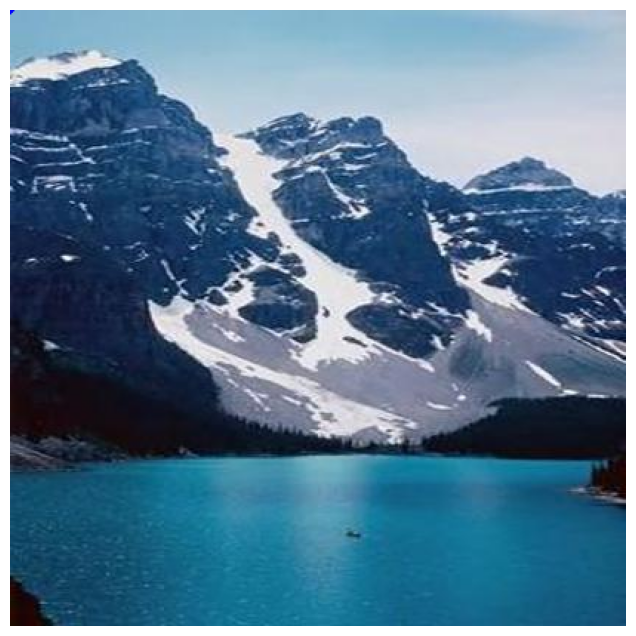

In [29]:
index = 5

label = y_test_box[index]

img = x_test[index]
pred_box, class_prob = predict(img, ResNet101_final)

print("Ground Truth: ", label)
print("Predicted Bbox: ", pred_box)

plot_prediction(img, label, pred_box)

# Is There A Better Way To Evaluate Bounding Box Prediction? (Introducing IoU As The Evaluation Metric Of BBox)
IoU, also known as Jaccard Index, is a widely used metric in object detection to measure the overlap between the predicted bounding box and the ground truth bounding box.

### How IoU works?
1. Calculate intersection: Determine the area of overlap between the predicted and ground truth bounding boxes.
2. Calculate union: Determine the total area covered by both the predicted and ground truth bounding boxes combined.
3. Calculate IoU: Divide the area of intersection by the area of union.

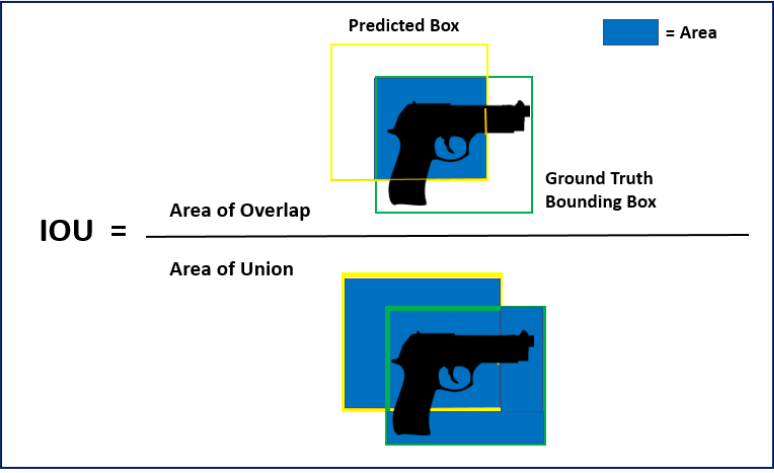

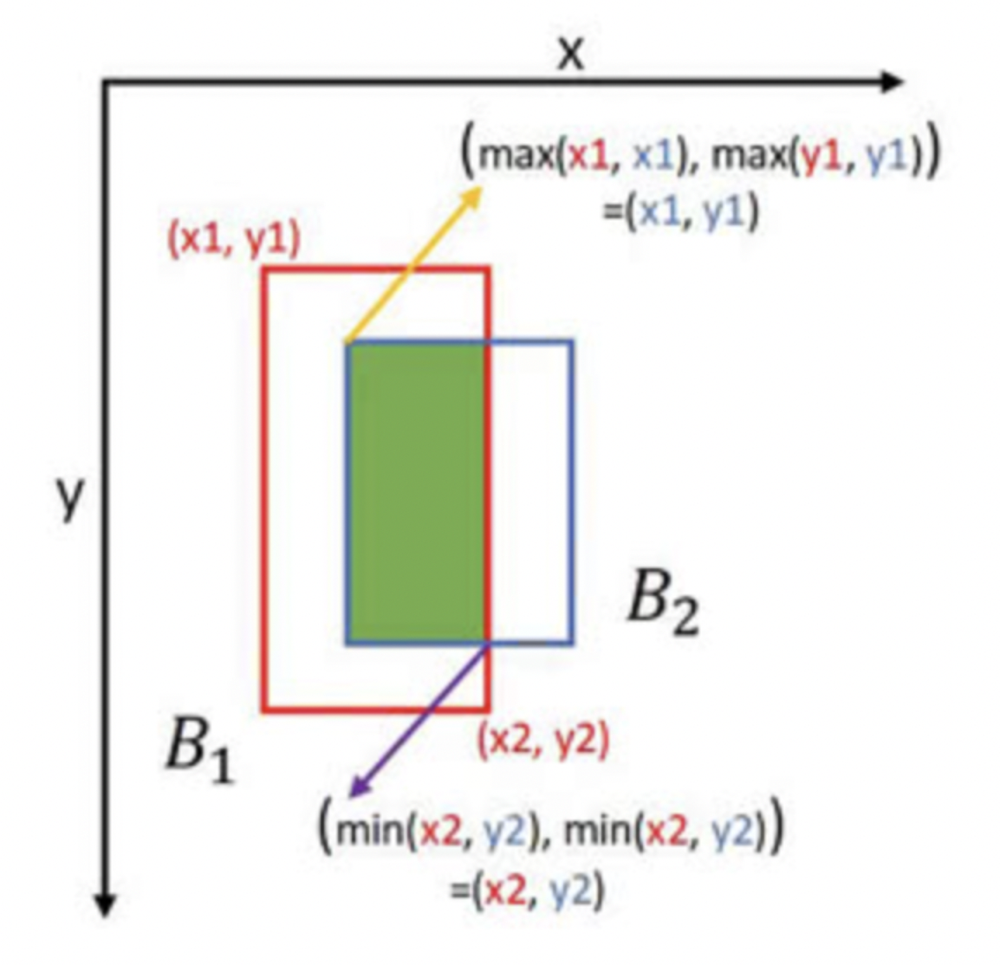

### Interpretation of IoU score
- IoU = 0: No overlap between the boxes.
- IoU = 1: Prefect overlap, the predicted box perfectly matches the ground truth box.
- 0 < IoU < 1: Partial overlap, with higher values indicating better alignment.

### Why IoU is better?
- Scale-invariant: Unlike metrics that rely on absolute distances, IoU is scale-invariant. This means it is not affected by the size of the object being detected.
- Focuses on overlap: IoU directly measures the degree of overlap between the predicted and ground truth boxes, which is more relevant for object detection tasks than simply measuring the distance between box centers.
- Widely used: IoU is a standard metric in object detection research and evaluation, making it easy to compare results with other models and benchmarks.

### Advanced IoU metrics
- Generalized IoU (GIoU): Addresses the limitations of IoU when there's no overlap by considering the minimum area enclosing both boxes.
- Distance-IoU (DIoU): Incorporates the center point distance and aspect ratio difference between the boxes.
- Complete IoU (CIoU): Further refines DIoU by considering the normalized distance between the centers of the boxes and their aspect ratio.

These advanced IoU metrics provide more nuanced evaluation of bounding box predictions, leading to better model training and improved object detection performance.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
Ground Truth:  [0.21939954 0.43021583 0.26096998 0.23741007]
Predicted Bbox:  [0. 1. 0. 0.]
ImgResolution (416, 416, 3)


0.0686578521276661

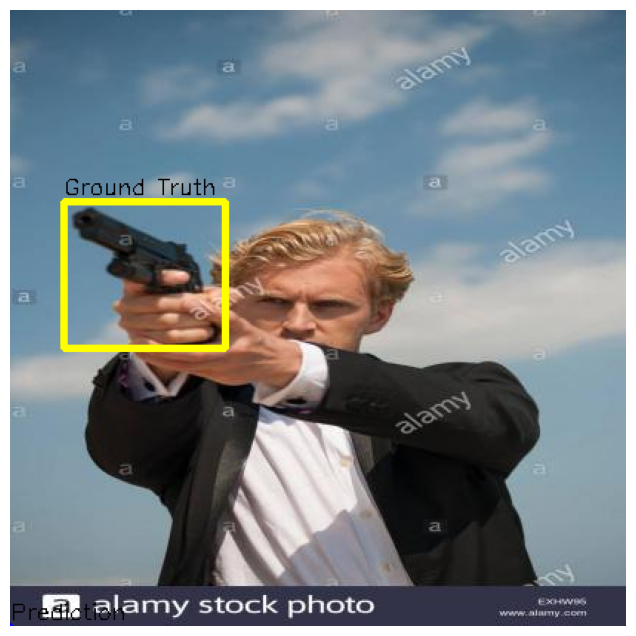

In [30]:
def compute_iou(label_box, pred_box):
    # determine the (x, y)-coordinates of the intersection rectangle
    gt = [0,0,0,0]
    x1, y1, x2, y2 = cv_coords(label_box)
    gt[0], gt[1], gt[2], gt[3] = x1, y1, x2, y2

    pred = [0,0,0,0]
    x1, y1, x2, y2=cv_coords(pred_box)
    pred[0], pred[1], pred[2], pred[3] = x1, y1, x2, y2

    inter_box_top_left = [max(gt[0], pred[0]), max(gt[1], pred[1])]
    inter_box_bottom_right = [min(gt[0] + gt[2], pred[0] + pred[2]), min(gt[1] + gt[3], pred[1] + pred[3])]

    inter_box_w = inter_box_bottom_right[0] - inter_box_top_left[0]
    inter_box_h = inter_box_bottom_right[1] - inter_box_top_left[1]

    intersection = inter_box_w * inter_box_h
    union = gt[2] * gt[3] + pred[2] * pred[3] - intersection

    iou_area = intersection / (union + 10e-3)
    return iou_area

index = 100

label = y_train_box[index]

img = x_train[index]
pred_box, class_prob = predict(img, ResNet101_final)

print("Ground Truth: ",label )
print("Predicted Bbox: ", pred_box)

plot_prediction(img, label, pred_box)
compute_iou(label, pred_box)

### Mean IoU
Mean IoU can be calculated by simply calculating IoU for all images in the test set and then taking an average.

In [31]:
def mean_intersection_over_union(X_test,gt_box, pred_box):
    iou = []
    for ind in range(len(X_test)):
        iou_area = compute_iou(gt_box[ind], pred_box[ind])
        iou.append(iou_area)
    iou = np.array(iou)
    return np.mean(iou)

gt_box = y_train_box
pred_box = predict(x_train, ResNet101_final, "batch")[0]

train_meanIOU = mean_intersection_over_union(x_train, gt_box, pred_box)

print(f"Mean IoU Train: {train_meanIOU}")

81/81 ━━━━━━━━━━━━━━━━━━━━ 283s 3s/step
Mean IoU Train: 0.0938621966738384


In [32]:
gt_box = y_test_box
pred_box = predict(x_test, ResNet101_final, 'batch')[0]

test_meanIOU = mean_intersection_over_union(x_test, gt_box, pred_box)

print(f"Mean IoU Test: {test_meanIOU}")

35/35 ━━━━━━━━━━━━━━━━━━━━ 109s 3s/step
Mean IoU Test: 0.17475163294496068


### Observations about Object Localization
- The output of Object Localization is fixed (i.e., 4 output coordinates that means only 1 bounding box).
- Only a single object present in an image can be localized using Object Localization.

# Detecting Multiple Objects In An Image - Object Detection
To find multiple objects in an image, Object Detection algorithms are used.

### Key differences
- Object Localization:
    - Focuses on finding a single object within an image.
    - Outputs a single bounding box and its class probability.
- Object Detection:
    - Aims to identify and locate multiple objects of different classes within an image.
    - Outputs multiple bounding boxes, each with its corresponding class probability.

### How Object Detection works?
1. Region proposal:
    - Traditional methods: Techniques like Selective Search or Edge Boxes generate potential regions of interest (ROIs) within the image.
    - Modern approaches: Region Proposal Networks (RPNs) with Deep Learning models like R-CNN efficiently generate proposals.
2. Feature extraction: Convolutional Neural Networks (CNNs) extract features from the entire image or the proposed regions.
2. Classification and Bounding Box Regression:
    - A Classifier predicts the class of each object within the proposed regions.
    - A Regressor refines the Bounding Box coordinates to better fit the actual object.

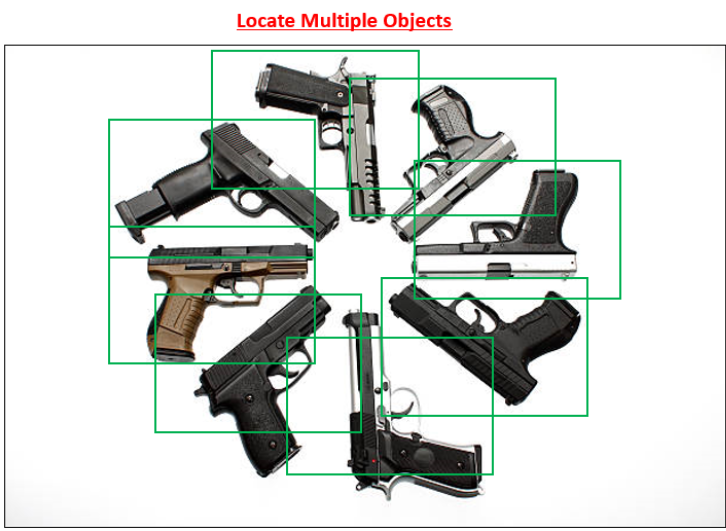

# Sliding Window Detection
"Slide a box across an image and classify each image crop inside a box".

Sliding Window detection is a fundamental technique in object detection, where a small window of a fixed size in moved systamatically across an image. At each position, a classifier (e.g., a Machine Learning model) analyzes the content within the window to determine if it contains an object of interest.

### How does Sliding Window work?
1. Define a window: A rectangular window of a specific size is created.
2. Slide across image: This window is symmetrically moved across the entire image, often with a certain stride (e.g., moving the window by a few pixels at each step).
3. Classification at each position: At each position, the image within the window is extracted and fed into a classifier (e.g., a pre-trained CNN).
4. Object detection: If the classifier predicts that the window contains the object of interest (e.g., a car), the window's position and size are considered a potential object detection.

### Why can Sliding Windows be considered as classification?
- Binary classification: At its core, the sliding window approach can be seen as a series of binary classification problems. For each window, the Classifier decides:
    - "Is there an object of interest within this window? (Yes/ No)".

### Limitation of Sliding Windows
- Computational cost: Processing every window with a Classifier can be computationally expensive, especially for large images or dense sliding windows.
- Fixed window size: Objects can vary in size, and a single fixed window size may not effectively detect objects of different scales.
- Inefficient: Many windows will contain no objects, leading to unnessary computations.

### Improvements and modern approaches
- Region Proposal Methods: Techniques like Selective Search and Region Proposal Networks (RPNs) generate more intelligent proposals for potential object locations, reducing the computational burden.
- Convolutional Neural Networks (CNNs): Modern object detection models like faster R-CNN, YOLO, and SSD leverage the power of CNNs to directly learn features and predict bounding boxes, making them significantly more efficient and accurate than traditional Sliding Window approaches.

### Deciding the size of the Sliding Window
The size of the sliding window is crucial in Object Detection. The following is a breakdown on how to approach this challenge,
1. Multiple window sizes:
    - The core issue: Objects in images can appear in various sizes. A fixed window size will miss smaller or larger objects.
    - Solution: Employ sliding windows of different sizes and scales. This involves,
        - Using windows with varying dimensions (e.g., 20x20, 50x50, 100x100 pixels).
        - Applying scaling factors to the same window size to capture objects at different distances or scales within the image.
2. Computational cost and efficiency: The computational cost of sliding windows can be a significant bottleneck. The following are some strategies to mitigate this,
- Reduce the number of windows:
    - Stride: Increase the stride (step size) a which the window moves across the image. This reduces the number of overlapping windows and speeds up the process.
    - Selective search: This technique generates a set of potential regions of interest (regions proposals) that are more likely to contain objects. This reduces the number of windows to be evaluated.
- Efficient feature extraction:
    - Image pyramids: Create multiple scaled versions of the image and apply sliding windows at each scale. This is more efficient than scaling the window itself.
3. CNN-based sliding window:
CNNs offer a more efficient approach,
- Convolutional layers: CNNs inherently perform a form of sliding window operation through their convolutional filters. These filters move across the image, extracting features at different locations.
- Feature maps: The output of convolutional layers are feature maps that represent the presence of specific features at different locations.
- Object detection layers: Specialized layers (e.g., Region Proposal Networks in Faster R-CNN) are added on top of the convolutional layers to predict the locations and sizes of potential objects.

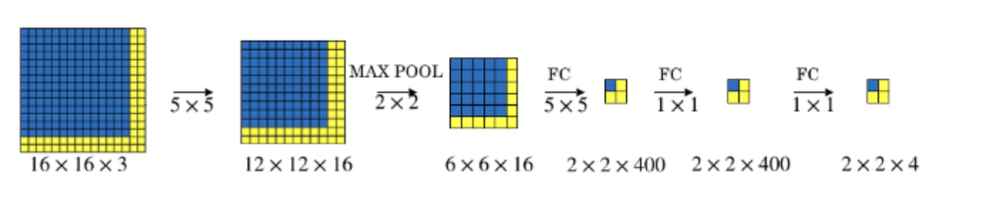

# How To Handle Single Objects Getting Detected Multiple Times Across Different Windows And Window Scales?

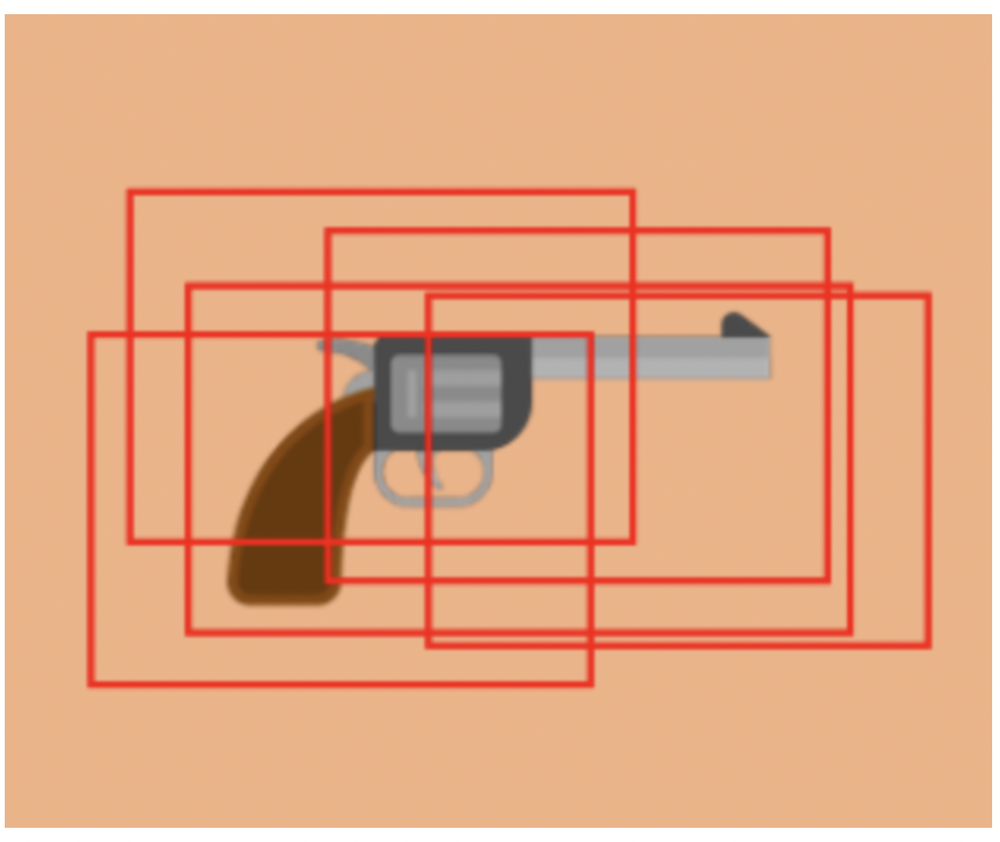

When using sliding windows of various sizes and scales, it is common to encounter multiple detections for the same objec. This occurs because,
- Overlapping windows: Adjacent windows, especially with smaller strides, might capture the same object, leading to redundant detections.
- Scale variations: The same object might be detected at different scales, resulting in multiple bounding boxes.

### Solutions
1. Non-Maximum Suppression (NMS):
    - Core idea: NMS is a widely used technique to eliminate redundant detections.
    - Process:
        1. Sort detections: Sort all detected bounding boxes based on their confidence scores (probability of containing the object).
        2. Select top detection: Choose the bounding box with the highest confidence.
        3. Calculate overlap: Compute the IoU (Intersection over Union) between the selected box and all other boxes.
        4. Suppress overlapping boxes: Discard any boxes that have an IoU greater than a predefined threshold with the selected box.
        5. Repeat: Select the next highest-confidence box and repeat steps 3 and 4 until all boxes are processed.
2. Bounding box regression:
    - Purpose: Refine the predicted bounding box coordinates to better match the actual object's location and size.
    - Approach:
        1. Train a regression model to predict adjustments to the window's coordinates (x, y, width, height).
        2. Apply these adjustments to the detected boundng boxes to improve their accuracy.

### Additional considerations
- Confidence threshold: Set a minimum confidence threshold to filter out low-confidence detections before applying NMS.
- IoU threshold: Adjust the IoU threshold to control the level of overlap allowed between bounding boxes. A higher threshold will suppress more boxes, potentially missing some valid detections.
- Combining NMS and Bounding Box Regression: For optimal results, combine NMS and Bounding Box Regression.

### Incorporating into the implementation
1. After detection: Apply NMS to the detected bounding boxes for each window size and scale.
2. Refine bounding boxes: Use Bounding Box Regression to further refine the coordinates of the selected boxes.

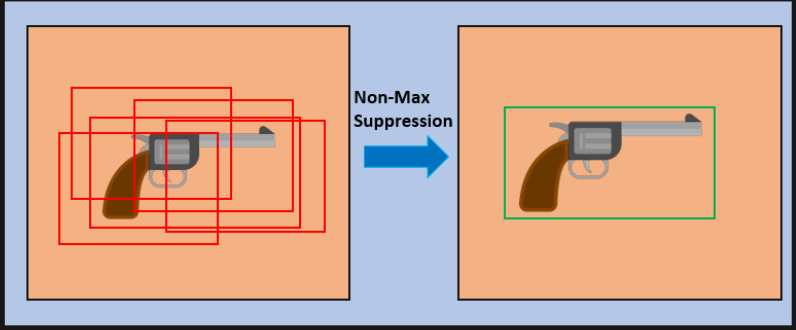

### NMS Algorithm
1. Initialize:
    - Create an empty list to store the final proposals.
    - Create a copy of the initial list of proposals.
2. Iterate:
    - Select top proposal: Select the proposal with the highest confidence score from the remaining proposals in the copy.
    - Add to final list: Add the selected proposal to the final proposal list.
    - Remove from the initial list: Remove the selected proposal from the copy of the initial list.
    - Calculate IoU: Calculate the Intersection over Union (IoU) between the selected proposal and all other remaining proposals in the copy.
    - Suppress overlapping proposals: Remove any remaining proposals from the copy that have an IoU with the selected proposal greater than the threshold value (N).
3. Repeat: Repeat steps 2 until no proposals remain in the copy of the initial list.
4. Return: Return the final list of proposals.

In [33]:
# implementation of NMS
def non_max_suppress(conf, xy_min, xy_max, threshold=.4):
    _, _, classes = conf.shape
    boxes = [(_conf, _xy_min, _xy_max) for _conf, _xy_min, _xy_max in zip(conf.reshape(-1, classes), xy_min.reshape(-1, 2), xy_max.reshape(-1, 2))]

    # iterate each class
    for c in range(classes):
        # sort boxes
        boxes.sort(key = lambda box: box[0][c], reverse = True)
        # iterate each box
        for i in range(len(boxes) - 1):
            box = boxes[i]
            if box[0][c] == 0:
                continue
            for _box in boxes[i + 1:]:
                # take IoU threshold into account
                if compute_iou(box[1], box[2], _box[1], _box[2]) >= threshold:
                    _box[0][c] = 0
    return boxes

The problem with using sliding windows is that, many positions and scales will have to be tested and passed to CNN, which is computationally expensive.

### Can the algorithm be optimized further?
Yes, by reducing the regions where object is not present.

# Two Stage Detector
Two Stage Detectors are a class of algorithms that excel at Object Detection by dividing the process into 2 distinct stages.
1. Region Proposal Generation:
    - The first stage focuses on identifying potential regions of interest within the image where objects are likely to be present.
    - This is achieved through techniques like Selective Search or more commonly, Region Proposal Networks (RPNs).
    - RPNs are deep Neural Networks that efficiently scan the image and propose bounding boxes that warrant further examination.
2. Object classification and localization:
    - In the second stage, each proposed region is passed through a classifier, typically a CNN.
    - The CNN determines if the region contains an object and if so, classifies the object (e.g., car, person, dog).
    - Additionally, bounding box regression is performed to refine the initial region proposals, ensuring a more precise localization of the detected objects.

### Key advantages of Two Stage Detectors
- High accuracy: The Two Stage approach generally leads to higher detection accuracy, especially in complex scenarios with overlapping or small objects.
- Precise localization: The refinement stage allows for more accurate bounding box placement around detected objects.
- Effective in complex scenes: Two Stage Detectors handle complex scenes and occlusions better due to the detailed analysis in the second stage.

### Popular Two Stage Detectors
- R-CNN (Regions with Convolutional Neural Networks): A pioneering Two Stage Detector that introduced the concept of using CNNs for object detection.
- Fast R-CNN: Improved upon R-CNN by sharing convolutional computations across multiple regions, significantly increasing speed.
- Faster R-CNN: Introduced the Region Proposal Network (RPN), a Deep Learning based approach for generating region proposals, further improving efficiency.
- Mask R-CNN: Extended Faster R-CNN to perform instance segmentation, allowing for pixel-level object localization.

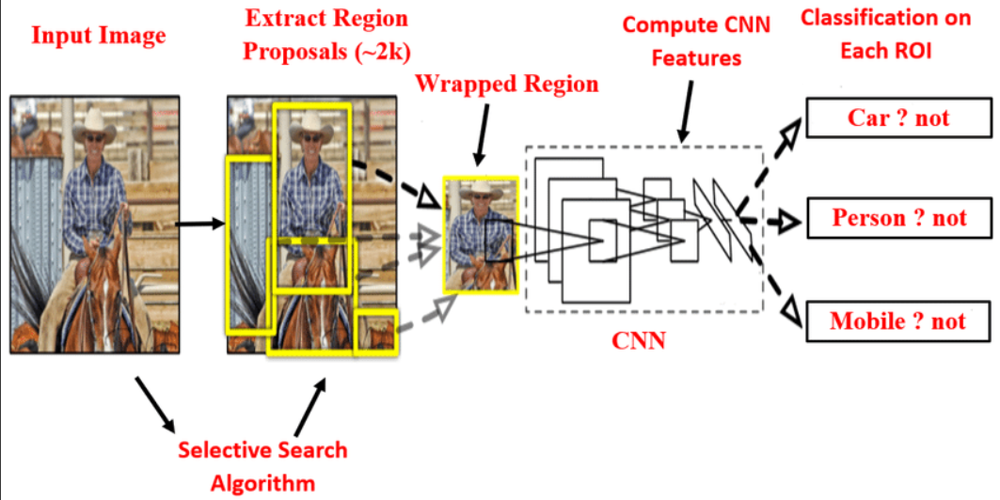

# R-CNN - Rich Feature Hierarchies For Accurate Object Detection

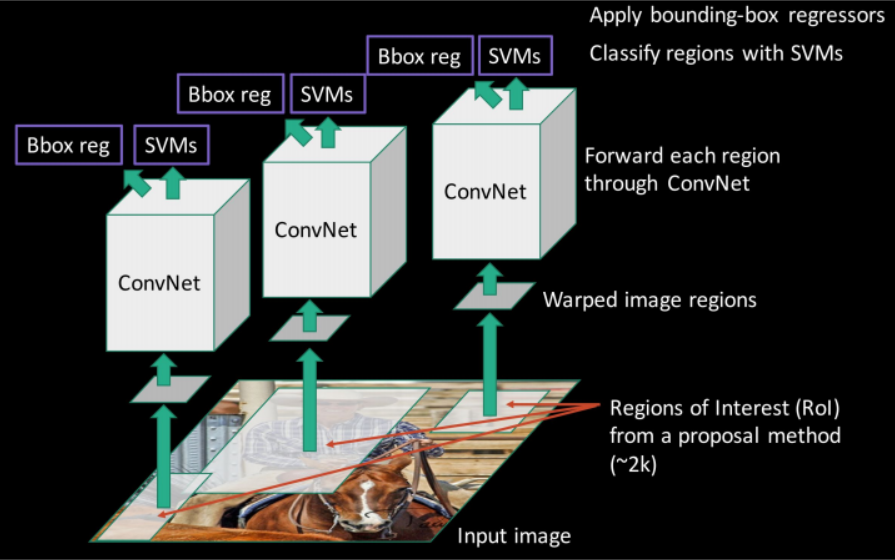

R-CNN is a pioneering Object Detection framework that revolutionized the field by effectively combining region-based proposals with deep Convolutional Neural Networks (CNNs).

### Key steps
1. Region proposal generation:
    - The process begins by generating a set of region proposals within the input image.
    - These proposals are potential Bounding Boxes that may contan objects of interest.
    - Techniques like Selective Search are commonly used to generate these proposals.
2. Feature extraction:
    - Each region proposal is then extracted from the image and warped into a fixed-size input for the CNN.
    - A pre-trained CNN (e.g., AlexNet, VGG16) is used to extract a fixed-length feature vector from each warped region.
    - This step involves feeding each region proposal through the CNN and extracting the activations from a specific layer (usually a Fully Connected layer).
3. Object classification:
    - The extracted feature vectors from each region propossal are fed into a set of SVMs.
    - Each SVM is trained to classify objects within a specific category (e.g., car, person, dog).
    - This step determines whether an object exists within the proposed region and if so, classifies it.
4. Bounding Box Regression:
    - To improve the accuracy of object localization, a separate regression step is performed.
    - This step refines the coordinates of the proposed Bounding Boxes to better fit the actual object boundaries.

### Key advantages
- High accuracy: R-CNN demonstrated significant improvements in object detection accuracy compared to previous methods.
- Leveraging pre-trained CNNs: Utilizing pre-trained CNNs for feature extraction allowed R-CNN to benefit from the knowledge learned on large datasets like ImageNet.

### Limitations
- Computational cost: R-CNN is computationally expensive due to the following,
    - Redundant feature extraction: The CNN needs to be run independently for each region proposal, leading to significant redundancy.
    - Slow training: The training process is slow as each region proposal is processed individually.

# Selective Search
Selective Search is a popular region proposal algorithm used in object detection. It aims to efficiently identify potential regions within an image that are likely to contain objects of interest. Instead of exhaustively searching the entire image with sliding windows, Selective Search focuses on generating a smaller set of promising regions, significantly reducing computational cost.

### How it works?
1. Over-segmentation: The process begins by over-segmenting the image into smaller regions using a graph-based segmentation method (like the one proposed by Felzenszwalb and Huttenlocher). This divides the image into numeri=ous small, interconnected segments.
2. Hierarchical grouping: Selective Search then employs a hierarchical grouping approach to merge these initial segments into larger regions. This merging is guided by 4 key similarity measures,
    - Color similarity: Measures the similarity of color distributions between regions.
    - Texture similarity: Measures the similarity of texture features within regions.
    - Size similarity: Prioritizes merging smaller regions earlier, ensuring a diverse range of region sizes.
    - Shape compatibility: Encourages merging regions that fit together well, avoiding the creation of irregular or unlikely shapes.
3. Region proposal generation:
    - At each step of the merging process, Bounding Boxes are created around the merged regions.
    - This generates a hierarchical set of region proposals, ranging from small initial segments to larger, more complex regions.
    - The algorithm typically generates a predefined number of region proposals (e.g., 2000) to be further processed by an Object Detector.

### Key advantages
- Efficiency: Selective Search is significantly more efficient than exhaustive sliding window approaches, as it focuses on promising regions.
- Diverse Proposals: The hierarchical merging process generates region proposals at various scales and shapes, increasing the likelihood of capturing objects of different sizes and orientations.
- Improved Accuracy: By focusing on more relevant regions, Selective Search can improve the overall accuracy of object detection systems.

# Is It Possible To Obtain End-To-End Deep Learning Based Object Detection?
- Approximately after a year, the successor of R-CNN, Fast R-CNN, was introduced.
- Similar to R-CNN, Fast R-CNN algorithm also utilizes Selective Search to obtain region proposals, but a novel change was made, i.e., Region of Interest (ROI) Pooling.
- Thanks to ROI Pooling the SVM layer was replaced by CNN Layers followed by Fully connected layers.
- ROI Pooling brought all the proposed regions to same scale or dimension.

# Fast R-CNN

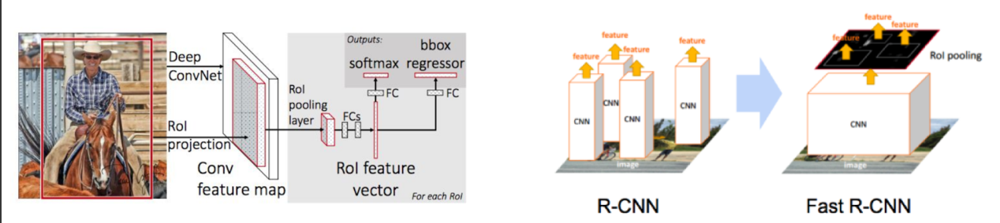

Fast R-CNN represents a significant advancement over the original R-CNN. While it still utilizes region proposals, it introduces key innovations that dramatically improve speed and efficiency.
1. CNN feature extraction:
    - Shared convolutional computations: Unlike R-CNN, where the CNN was applied to each region proposal individually, Fast R-CNN applies the CNN only once to the entire input image.
    - Feature map: This results in a feature map that encapsulates the rich spatial information of the entire image.
    - Efficiency gain: This shared computation across all regions leads to a substantial reduction in computational cost.
2. Region of Interest (ROI) Pooling:
    - ROI Pooling is the cornerstone of Fast R-CNN. It addresses a critical challenge: region proposals have varying sizes and shapes, while the subsequent fully connected layers require fixed-size inputs.
    - How does it work?
        - Given a region proposal (defined by its coordinates on the image), ROI Pooling extracts a fixed-size feature map from the main convolutional feature map.
        - It divides the proposed region into a predefined grid (e.g., 7x7).
        - For each grid cell, it performs max-pooling to obtain a single feature value.
        - This process effectively downsamples the region proposal into a fixed-size feature vector, regardless of its original dimensions.
    - Example: If the proposed region is 14x14 pixels and the desired output is a 7x7 feature map, ROI Pooling divides the region into 49 grids (7x7). Then, within each grid, it performs max-pooling to obtain a single feature value.
3. Classification and Bounding Box Regression:
    - From feature map to predictions: The fixed-size feature vectors obtained from ROI Pooling are then fed into two fully connected layer branches:
        - Classification branch: Predicts the class probabilities for each region proposal (e.g., "car," "person," "background").
        - Bounding Box Regression branch: Refines the coordinates of the proposed bounding boxes to better match the actual object locations.
4. End-to-End training:
    - Joint optimization: Fast R-CNN allows for end-to-end training of the entire system. This means that the CNN, ROI Pooling layer, and the classification/regression layers are all trained jointly to optimize the overall object detection performance.
    - Backpropagation: The gradients from the loss functions (classification loss and bounding box regression loss) are backpropagated through the entire network, enabling efficient training of all components.

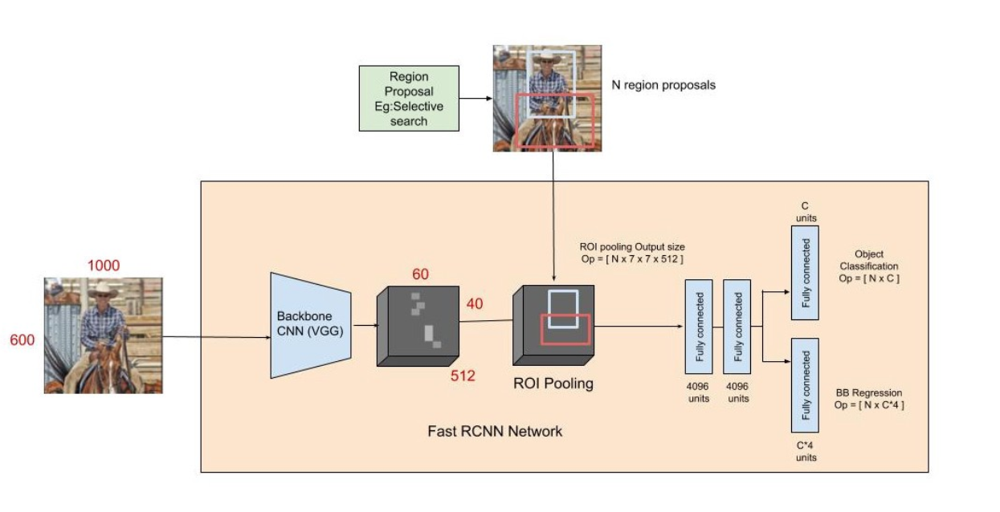

# ROI (Region Of Interest) Pooling
ROI Pooling is a crucial operation in the Fast R-CNN object detection architecture. It serves a critical role in bridging the gap between region proposals of varying sizes and the fixed-size inputs required by fully connected layers in the neural network.

### Challenge
- Variable region sizes: Region proposals generated from an image can have diverse sizes and shapes.   
- Fixed input requirement: Fully connected layers in a neural network require fixed-size input vectors.

### Solution
ROI Pooling addresses this challenge by extracting a fixed-size feature map from each region proposal, regardless of its original size. Here's a breakdown of the process:
1. Region proposal mapping:
    - Given a region proposal (defined by its coordinates on the image), ROI Pooling first maps this region onto the corresponding area within the convolutional feature map.
    - This mapping accounts for the spatial downsampling that occurs during the convolutional feature extraction process.
2. Spatial binning:
    - The mapped region on the feature map is then divided into a predefined grid of equally sized spatial bins.
    - For example, a common grid size is 7x7.
3. Max pooling within bins:
    - Within each spatial bin, max pooling is performed.   
    - This means that the maximum value among all the feature map activations within that bin is selected.   
4. Fixed size output:
    - This process is repeated for all bins in the grid, resulting in a fixed-size feature map (e.g., 7x7) for the given region proposal.

### Benefits
- Handles variable sizes: It effectively handles region proposals of different sizes by producing a consistent output size.   
- Efficient computation: It avoids the need for resizing or warping region proposals to a fixed size, which would be computationally expensive and could introduce distortions.   
- End-to-end training: ROI Pooling enables end-to-end training of the entire Fast R-CNN system, as it can be integrated into the backpropagation process.

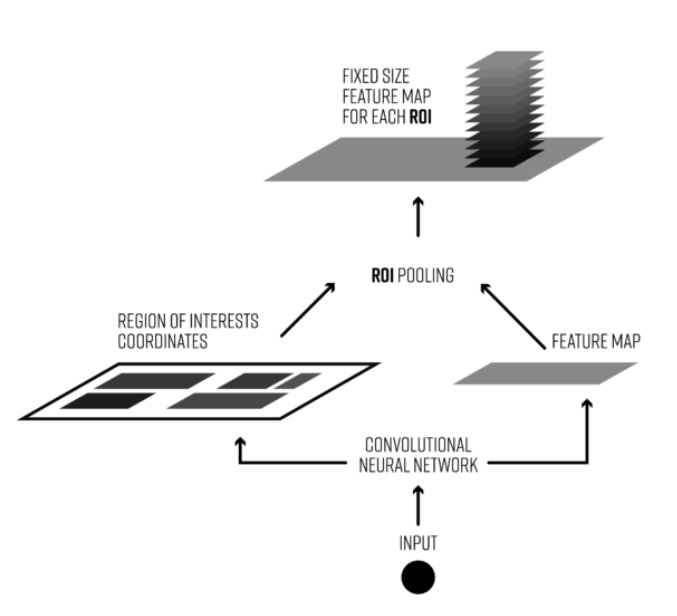

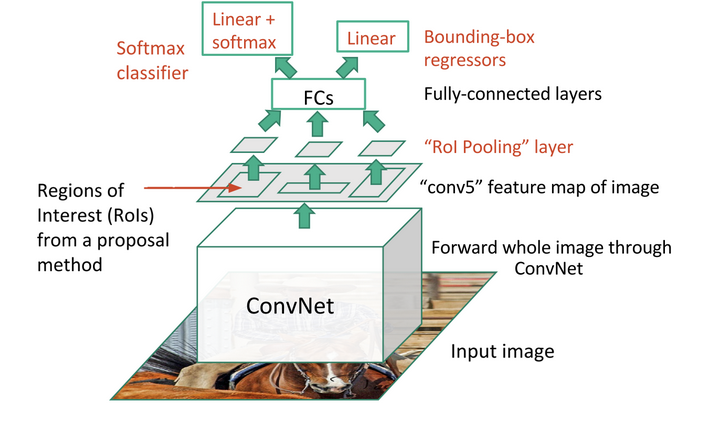

### Example
Consider a small example to see how ROI Pooling works. ROI Pooling is performed on a single `8x8` feature map, 1 region of interest and and output size of `2x2`. The feature map looks as follows,

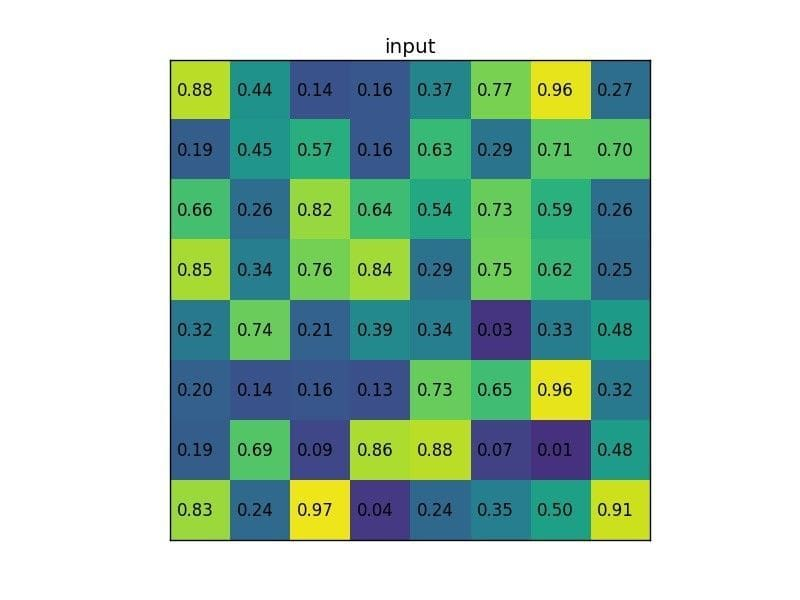

Consider that there is also a region proposal (top left, bottom right coordinates): (0, 3), (7, 8). It would looks as follows in the picture,

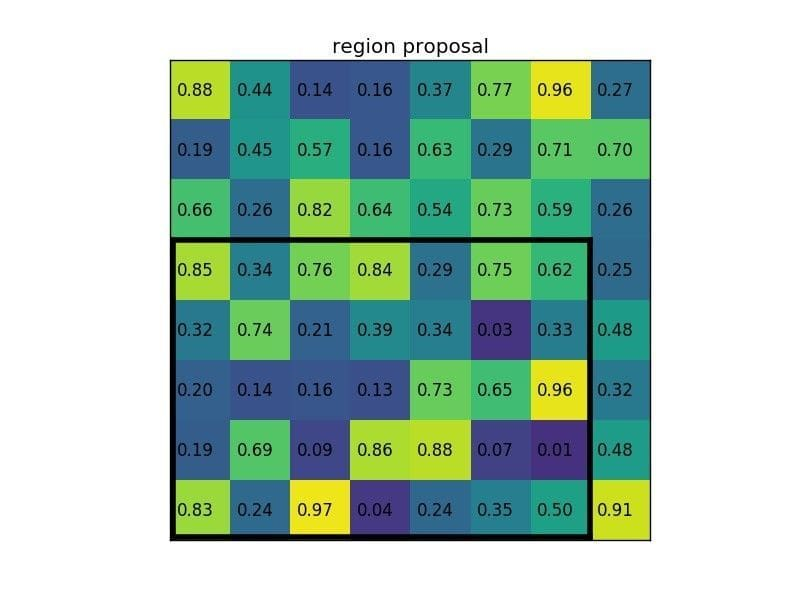

Normally, there would be multiple maps and multiple proposals for each of them, but things are kept simple for the sake of the example. By dividing it into (`2x2`) sections (because the output size is `2x2`) the following is obtained,

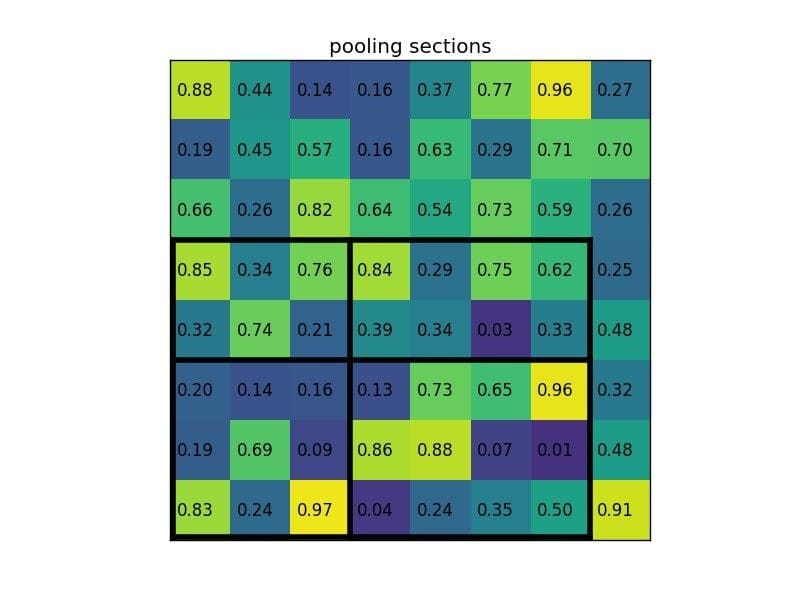

Notice that the size of the region of interest does not have to be perfectly divisible by the number of pooling sections (in this case, ROI is `7x5` and there are `2x2` pooling sections). The max values in each of the sections are,

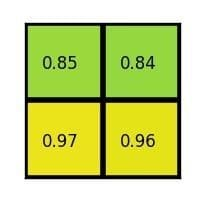

And that is the output from the Region of Interest pooling layer. The following is an animation that represents whatever is explained in this example,

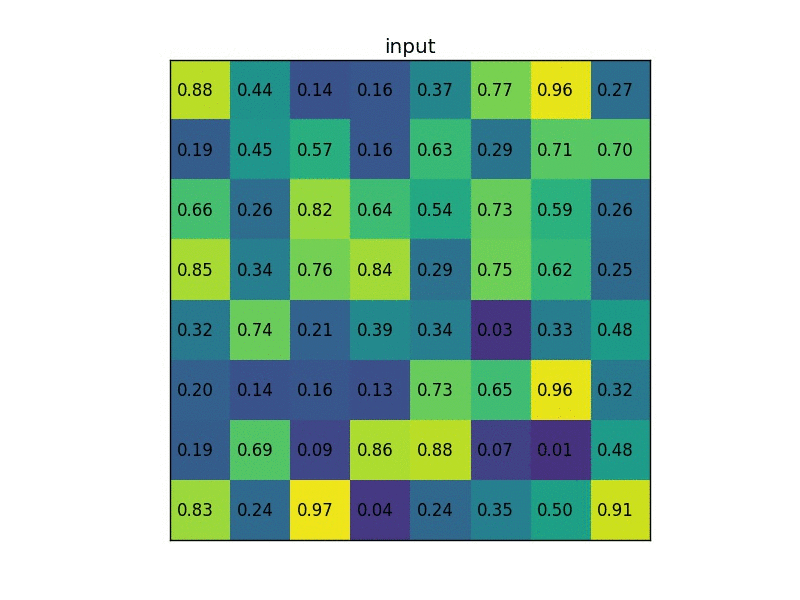

# Drawbacks Of Fast R-CNN
The major bottleneck in Fast R-CNN lies in the reliance on external region proposal algorithms like Selective Search. The following are Selective Search's drawbacks,
- Computational cost: Selective Search is computationally expensive, significantly impacting the overall speed of the object detection pipeline.
- Lack of end-to-end training: Selective Search operates independently of the subsequent object detection stages. This prevents end-to-end training and limits the ability to jointly optimize the entire system.
- Limited adaptability: Selective Search is not specifically tailored to the object detection task at hand. It lacks the ability to learn and adapt to the specific characteristics of the objects being detected.

To overcome these limitations and achieve a truly end-to-end trainable and efficient object detection system, the region proposal generation process needs to be integrated into the Deep Learning framework.

# Faster R-CNN - Real Time Object Detection With Region Proposal Networks

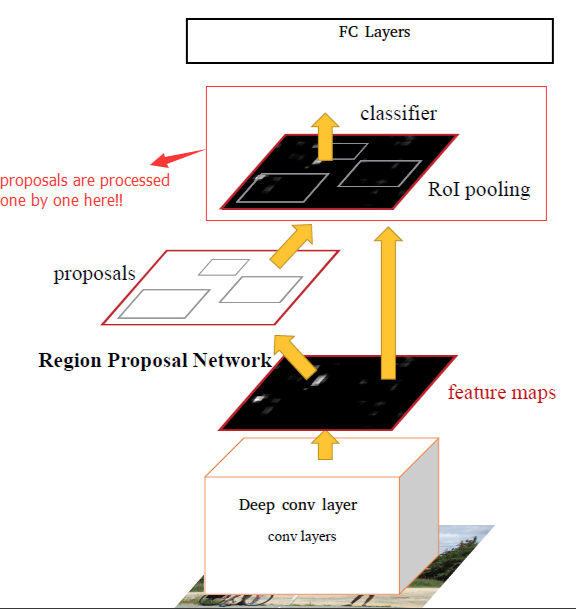

Faster R-CNN revolutionized object detection by introducing the Region Proposal Network (RPN), enabling end-to-end training and significantly improving efficiency. The following is a breakdown of the key steps,
1. Backbone network:
    - Foundation: The process begins with a pre-trained convolutional neural network (CNN) like VGG-16 or ResNet. This pre-trained network has already learned powerful feature representations on a massive dataset like ImageNet.
    - Feature extraction: The input image is fed into this backbone network. The final convolutional layers of the network produce feature maps that encode rich spatial information about the image. These feature maps serve as the input for the subsequent stages.
2. Region Proposal Network (RPN):
    - Sliding window approach: The RPN is a fully convolutional network that slides across the feature map. At each location, it predicts:
        - Objectness score: A binary classification score indicating whether an object is present within a predefined region (anchor box) or not.
        - Bounding Box Regression: Refines the coordinates of the anchor boxes to better match the actual object boundaries.
    - Anchor boxes:
        - The RPN operates on a set of anchor boxes at each location.
        - Anchor boxes are predefined boxes with different scales and aspect ratios, allowing the RPN to consider objects of various sizes and shapes.
        - This mechanism ensures that the RPN can effectively detect objects across a wide range of scales and aspect ratios.
    - Output: The RPN generates a set of region proposals (bounding boxes) along with their corresponding objectness scores.
3. Region of Interest (ROI) Pooling:
    - Mapping proposals: The generated region proposals are mapped onto the feature map.
    - Spatial binning: Each region proposal is divided into a fixed number of spatial bins (e.g., 7x7).
    - Max pooling: Within each bin, max pooling is performed to extract a single feature value.
    - Fixed-size output: This process results in a fixed-size feature vector for each region proposal, regardless of its original size.
4. Classification and Bounding Box Regression:
    - Classification head: The fixed-size feature vectors from the ROI Pooling layer are fed into a fully connected layer to classify the objects within each region proposal. This layer predicts the probability of each object class (e.g., "car," "person," "dog").
    - Bounding Box Regression head: Another fully connected layer refines the coordinates of the proposed bounding boxes to achieve more accurate object localization.
5. Output: The final output of Faster R-CNN consists of a set of detected objects, each with its associated class label and refined bounding box coordinates.

### Key advantages
- End-to-end training: The entire system, including the RPN, ROI Pooling, and Classification or Regression heads, can be trained end-to-end, allowing for joint optimization of the entire pipeline.
- Efficiency: Eliminating the need for trained end-to-end, allowing for joint optimization of the entire pipeline.
- Accuracy: The integration of the RPN and end-to-end training leads to significant improvements in object detection accuracy.

# Region Proposal Network (RPN) In Faster R-CNN
1. Core concept:
    - End-to-end learning: The RPN is a crucial component of Faster R-CNN, enabling end-to-end training for object detection.
    - Efficient proposal generation: Unlike previous methods that relied on external region proposal algorithms like Selective Search, the RPN generates region proposals directly from the convolutional feature maps extracted from the image.
    - Simultaneous prediction: The RPN simultaneously predicts two things,
        - Objectness score: A binary classification score indicating whether an object is likely to be present within a specific region (foreground) or not (background).
        - Bounding Box Regression: Refines the coordinates of proposed bounding boxes to better match the actual object boundaries.
2. Anchor boxes:
    - Reference Points: RPN utilizes a set of predefined anchor boxes at each location on the feature map. These anchor boxes have different scales and aspect ratios (e.g., square, tall, wide).
    - Scale and Aspect Ratio Variation: This mechanism allows the RPN to consider objects of various sizes and shapes, increasing its ability to detect diverse objects within an image.
3. Sliding window approach:
    - Convolutional operation: The RPN operates in a sliding window fashion across the feature map. At each location, it considers the anchor boxes and predicts the objectness score and bounding box regression for each anchor.
    - Efficiency: This approach is computationally efficient as the RPN shares convolutional computations across the entire feature map, unlike methods that process each region proposal independently.
4. Integration with Faster R-CNN:
    - Shared features: The RPN and the object detection network (Fast R-CNN) share the initial convolutional layers. This allows for efficient computation as the feature map is only computed once.
    - Improved accuracy: End-to-end training enables joint optimization of region proposal generation and object detection, leading to significant improvements in overall accuracy.

### Key advantages
- End-to-end training: Enables efficient training and optimization of the entire object detection system.
- Efficiency: Eliminates the need for extrenal region proposal algorithms, significantly improving speed.
- Flexibility: Can adapt to different object scales and aspect ratios effectively.

# How Does RPN Work?
1. Feature Extraction:
    - Backbone CNN: A pre-trained convolutional neural network (like VGG-16 or ResNet) extracts features from the input image.   
    - Feature Map: The final convolutional layers of this network produce feature maps that encode rich spatial information about the image. These feature maps serve as the input for the RPN.   
2. Anchor Boxes:
    - Predefined Boxes: At each location on the feature map, a set of anchor boxes with different scales and aspect ratios are defined.   
    - Scale and Aspect Ratio Variation: This is crucial as objects can appear in various sizes and shapes within an image.   
    - Example: Typical anchor boxes might include squares of different sizes, as well as boxes with varying width-to-height ratios (e.g., 1:2, 2:1).
3. RPN Structure:
    - Convolutional Layers: The RPN itself consists of a small fully convolutional network.   
    - Two Output Branches: At each location, the RPN predicts:
    - Objectness Score: A binary score indicating whether an object is likely to be present within the corresponding anchor box (foreground) or not (background).   
    - Bounding Box Regression: Refines the coordinates (x, y, width, height) of the anchor boxes to better match the actual object boundaries.
4. Classification and Regression:
    - Objectness Score: The RPN classifies each anchor box as either "object" or "not object" (background).   
    - Bounding Box Refinement: The regression branch predicts offsets to the anchor box coordinates, allowing the RPN to adjust the box size and position to better fit the actual object.   
5. Region Proposals:
    - Filtering: The RPN generates a set of region proposals (bounding boxes) based on the objectness scores and refined coordinates.   
    - Non-Maximum Suppression (NMS): NMS is applied to filter out highly overlapping region proposals, ensuring that only the most confident proposals are retained.

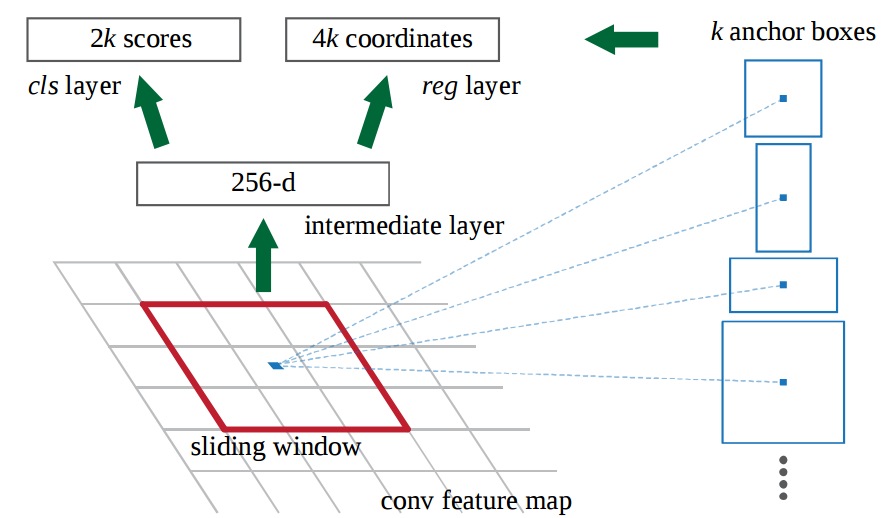

### Loss function of RPN
RPN's loss function is a combination of 2 terms,
- Classification loss: Typically binary cross-entropy loss for classifying anchor boxes as foreground or background.   
- Regression loss: Smooth L1 loss is commonly used to penalize the difference between the predicted bounding box offsets and the ground truth offsets.

It is given by the following equation,

$L(\{p_i\}, \{t_i\}) = \frac{1}{N_{cls}} \sum{L_{cls}(p_i, p_i^*)} + \lambda \frac{1}{N_{cls}} \sum{p_i^* L_{reg}(t_i, t_i^*)}$

In summary, RPN is a fully convolutional network that operates directly on the feature map extracted from the input image. It efficiently generates a set of region proposals by considering anchor boxes of various scales and aspect ratios at each location on the feature map. For each anchor box, the RPN predicts an objectness score (indicating the likelihood of an object being present) and bounding box regression offsets to refine the initial anchor box coordinates. This allows the RPN to efficiently identify potential object locations within the image, significantly improving the speed and accuracy of the object detection process.

# Training Of Faster R-CNN
Training of Faster R-CNN involves optimizing several components simultaneously. The following is a breakdown,
1. Loss function:
    - Multi-task loss: Faster R-CNN employs a multi-task loss function that combines the following,
        - RPN Classification loss: Binary cross-entropy loss to classify anchor boxes as either foreground (containing an object) or background.
        - RPN Regression loss: Smooth L1 loss to refine the Bounding Box coordinates predicted by the RPN.
        - Fast R-CNN Classification loss: Softmax loss to classify the objects within the proposed regions.
        - Fast R-CNN Regression loss: Smooth L1 loss to further refine the Bounding Box coordinates predicted by the Fast R-CNN module.
2. Training procedure:
    - Alternating training: Initially, the RPN and Fast R-CNN modules are often trained alternatively,
        - Train RPN: Train the RPN to generate region proposals while keeping the weights of the shared convolutional layers fixed.
        - Train Fast R-CNN: Train the Fast R-CNN module using the region proposals generated by the trained RPN.
    - Joint training: After initial alternating training, the entire network (including the RPN, Fast R-CNN, and shared convolutional layers) can be trained jointly to optimize the overall performance.
3. Backpropagation:
    - End-to-End Backpropagation: The gradients of the combined loss function are backpropagated through the entire network, allowing for efficient and effective training of all components.

### Key considerations
- Data augmentation: Techniques like random flipping, cropping, and color jittering are commonly used to augment the training data and improve the model's generalization ability.
- Hyperparameter tuning: Careful tuning of hyperparameters such as learning rate, weight decay, and the number of training iterations is crucial for achieving optimal performance.

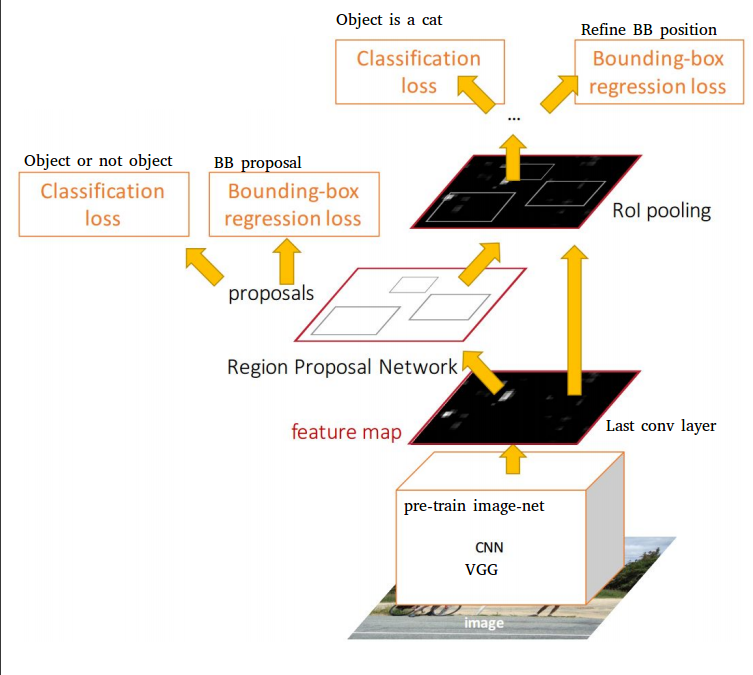

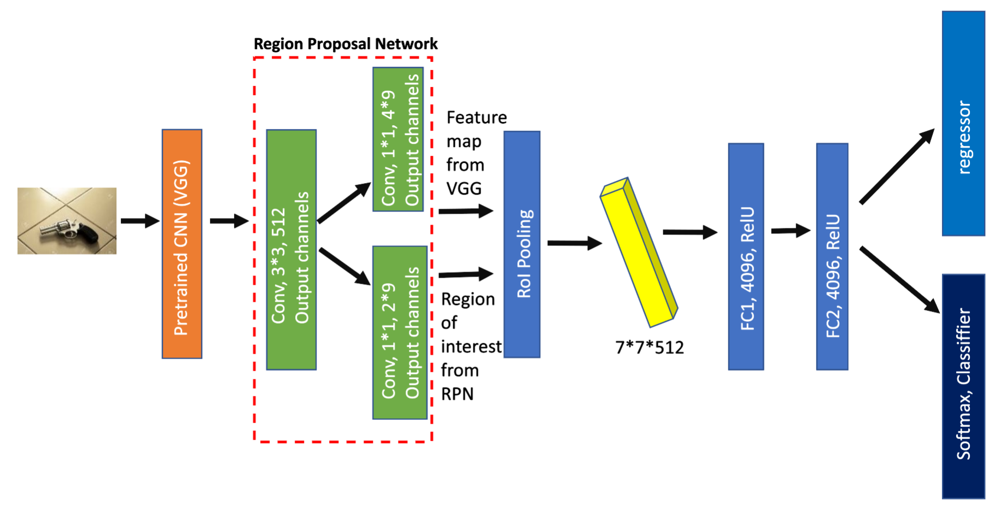

# Comparison Of All 3 Versions Of R-CNN On VOC 2007 Dataset

|   |  R-CNN | Fast R-CNN | Faster R-CNN |
| :-: | :-: | :-: | :-: |
| External region proposal method | Yes | Yes | No |
| Test time per image | 50 seconds | 2 seconds | 0.2 seconds |
| Speed-up | 1x | 25x | 250x |
| mAP (VOC 2007) | 66.0% | 66.9% | 66.9% |

# Code Implementation Of Faster R-CNN

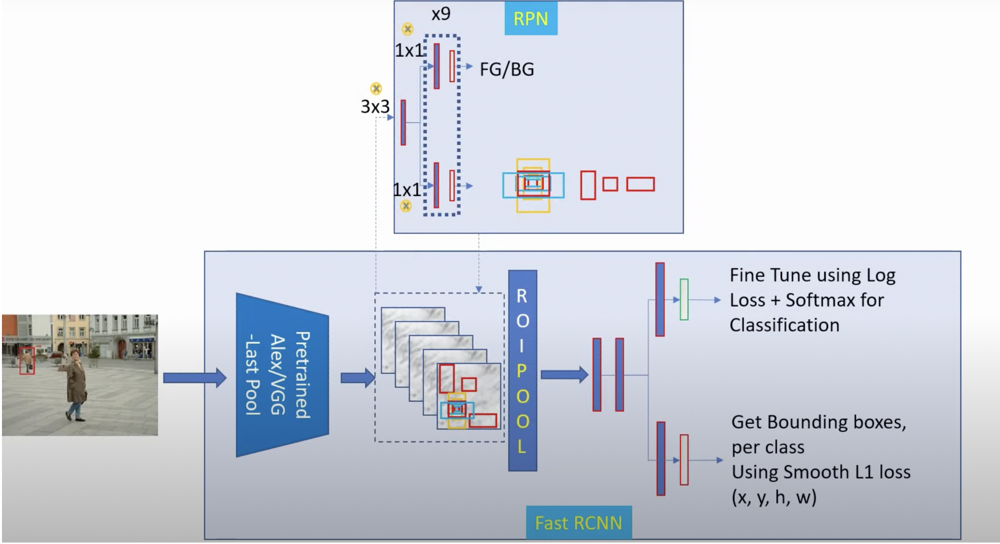

Link: https://github.com/AarohiSingla/Faster-R-CNN-on-Custom-Dataset/blob/main/training_fasterrcnn.ipynb